In [16]:
import numpy as np
import matplotlib.pyplot as plt
from src.data_generation.datasets import gummy_worm_dataset_family, exclamation_mark_dataset_family

In [17]:
from src.utilities.utils import sample_uniformly_within_bounds
from sklearn.model_selection import train_test_split
from src.utilities.experiment_utils import train_svm, train_neural_network, train_logistic_regression, \
    train_random_forest

datasets = gummy_worm_dataset_family()

p_preds_svm = []
p_preds_nn = []
p_preds_lr = []
p_preds_rf = []
p_trues = []

X_grid = sample_uniformly_within_bounds([-5, -5], [15, 15], size=400000)
for dataset in datasets:
    X, y = dataset.generate_data(10000)
    X_train, _, y_train, _ = train_test_split(X, y, test_size=0.5, random_state=42)
    
    print("Predicting for", dataset.title)
    
    # Training and predicting
    svm = train_svm(X_train, y_train)
    p_preds_svm.append(svm.predict_proba(X_grid)[:, 1])
    
    nn = train_neural_network(X_train, y_train, sample_dim=dataset.n_features)
    p_preds_nn.append(nn.predict(X_grid)[:, 1])
    
    lr = train_logistic_regression(X_train, y_train)
    p_preds_lr.append(lr.predict_proba(X_grid)[:, 1])
    
    rf = train_random_forest(X_train, y_train)
    p_preds_rf.append(rf.predict_proba(X_grid)[:, 1])
    
    
    print("True probabilities for", dataset.title)
    # True probabilities
    p_trues.append(dataset.cond_prob(X_grid, k=1))


Predicting for Gummy Worm Dataset
12500/12500 ━━━━━━━━━━━━━━━━━━━━ 10s 807us/step
True probabilities for Gummy Worm Dataset
Predicting for Gummy Worm Dataset (Variation 0)
12500/12500 ━━━━━━━━━━━━━━━━━━━━ 12s 960us/step
True probabilities for Gummy Worm Dataset (Variation 0)
Predicting for Gummy Worm Dataset (Variation 1)
12500/12500 ━━━━━━━━━━━━━━━━━━━━ 13s 1ms/step
True probabilities for Gummy Worm Dataset (Variation 1)
Predicting for Gummy Worm Dataset (Variation 2)
12500/12500 ━━━━━━━━━━━━━━━━━━━━ 12s 942us/step
True probabilities for Gummy Worm Dataset (Variation 2)
Predicting for Gummy Worm Dataset (Variation 3)
12500/12500 ━━━━━━━━━━━━━━━━━━━━ 12s 944us/step
True probabilities for Gummy Worm Dataset (Variation 3)
Predicting for Gummy Worm Dataset (Variation 4)
12500/12500 ━━━━━━━━━━━━━━━━━━━━ 12s 928us/step
True probabilities for Gummy Worm Dataset (Variation 4)
Predicting for Gummy Worm Dataset (Variation 5)
12500/12500 ━━━━━━━━━━━━━━━━━━━━ 12s 937us/step
True probabilities for

In [18]:
p_pred_mean_svm = np.mean(np.array(p_preds_svm), axis=0)
p_pred_mean_nn = np.mean(np.array(p_preds_nn), axis=0)
p_pred_mean_lr = np.mean(np.array(p_preds_lr), axis=0)
p_pred_mean_rf = np.mean(np.array(p_preds_rf), axis=0)
p_true_mean = np.mean(np.array(p_trues), axis=0)

(400000,)
True
(400000,)
True
(400000,)
True
(400000,)
True


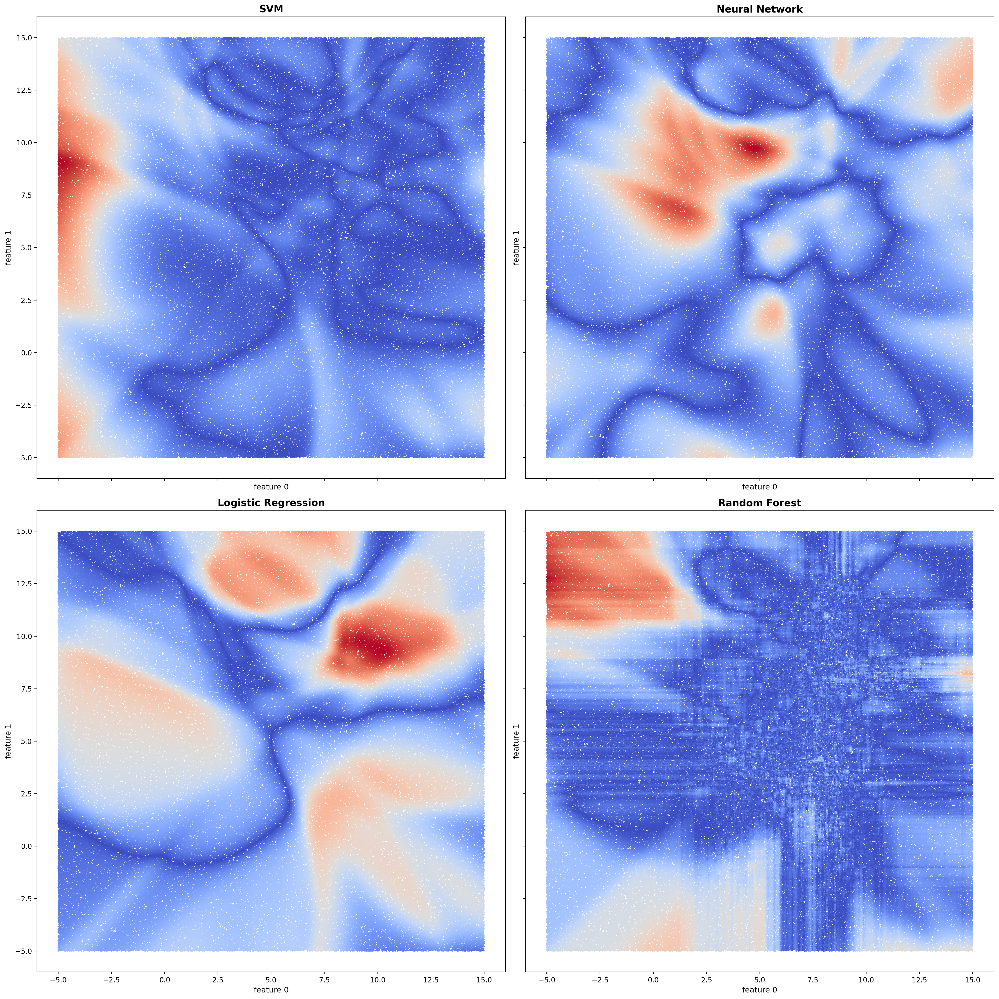

In [19]:
from src.utilities.utils import plot_samples_probability_mask

fig, axs = plt.subplots(2, 2, figsize=(20, 20), dpi=200, sharex=True, sharey=True)

axs = axs.flatten()

models = ["SVM", "Neural Network", "Logistic Regression", "Random Forest"]
for i, p_pred_mean in enumerate([p_pred_mean_svm, p_pred_mean_nn, p_pred_mean_lr, p_pred_mean_rf]):
    ax = axs[i]
    
    prob_diff = np.abs(p_true_mean - p_pred_mean)
    print(prob_diff.shape)
    print(np.all((prob_diff >= 0) & (prob_diff <= 1)))

    
    ax.scatter(X_grid[:, 0], X_grid[:, 1], c=prob_diff, cmap='coolwarm', s=1)
    

    ax.set_xlabel("feature 0", fontsize=11)
    ax.set_ylabel("feature 1", fontsize=11)
    ax.set_title(models[i], fontsize=14, fontweight='bold')
    
plt.savefig("./probability_difference_gummy_worm_family.png")
plt.tight_layout()
